# Jogos Evolutivos

#### Nome: Arthur Pontes Nader
#### Matrícula: 2019022294

## Bibliotecas

In [1]:
import numpy as np
import matplotlib.pyplot as plt

## Estados possíveis

0 - Desertor - vermelho

1 - Cooperador - azul

## Funções

In [2]:
def gerar_rede(L):

    N = L*L
    rede = [np.random.choice([1,0]) for i in range(N)]

    return np.array(rede)

In [3]:
def gerar_vizinhos(L):

  N = L*L
  vizinhos = np.zeros((N, 4), dtype = np.int32)

  for k in range(N):

      vizinhos[k][0] = k + 1
      if((k+1)%L) == 0:
          vizinhos[k][0] = k + 1 - L

      vizinhos[k][1] = k + L
      if(k > N - 1 - L):
          vizinhos[k][1] = k + L - N
      vizinhos[k][2] = k - 1

      if(k%L == 0):
          vizinhos[k][2] = k + L - 1
          
      vizinhos[k][3] = k - L
      if(k < L):
          vizinhos[k][3] = k + N - L

  return vizinhos

In [4]:
def mostrar_rede(rede, iteracao = "0"):
    
  L = int(np.sqrt(len(rede)))  
  rede = np.reshape(rede, (L,L))

  plt.figure(figsize=(8, 8))
  
  
  mapa = np.zeros((L,L,3))

  mapa[rede==0] = [0.95,0.1,0.05]
  mapa[rede==1] = [0.05,0.05,0.95]
  
  plt.imshow(mapa)

  if iteracao == "0":
    plt.title("Configuração Inicial\n", fontsize = 18)
  else:
    plt.title("Iteração " + iteracao + "\n", fontsize = 18)
        
  plt.axis('off') 
  plt.plot()

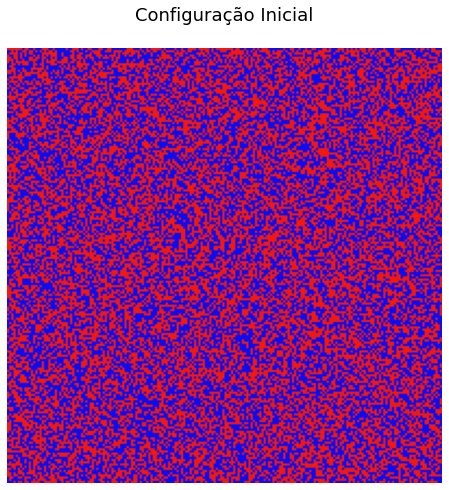

In [5]:
r = gerar_rede(200)
mostrar_rede(r)

In [6]:
def calcular_ganhos(rede, vizinhos, b):
    
    N = len(rede)
    ganhos = np.zeros(N)
    
    for i in range(N):
        
      total = 0
    
      for k in range(4):
          total += rede[vizinhos[i, k]]
        
      if rede[i] == 0:
        ganhos[i] = b * total
        
      else:
        ganhos[i] = 1 + total
    
    return ganhos

In [7]:
def contar_casos_na_rede(rede):
    
    desertores = list(rede).count(0)
    cooperantes = list(rede).count(1)
    
    return [desertores, cooperantes]

## Funções para evolução temporal

In [8]:
def atualizar_rede(rede, vizinhos, ganhos, K):
  
  N = len(rede)
  nova_configuracao = np.copy(rede)

  for i in range(N):
        
    viz = np.random.randint(4)
    num_vizinho = vizinhos[i, viz]
    
    Ex = ganhos[i]
    Ey = ganhos[num_vizinho]
    
    W = 1 / (1 + np.power(np.e, (-(Ey - Ex) / K)))
        
    if np.random.random() < W:
        
        nova_configuracao[i] = rede[num_vizinho]
        
  return nova_configuracao

In [9]:
def iniciar_jogo(L, b, K, iteracoes = 30):

    configuracao_atual = gerar_rede(L)
    vizinhos = gerar_vizinhos(L)
    ganhos_atuais = calcular_ganhos(configuracao_atual, vizinhos, b)
    
    configuracoes = [configuracao_atual]
    evolucao_dos_estados = np.array([contar_casos_na_rede(configuracao_atual)])

    for i in range(iteracoes):

      configuracao_atual = atualizar_rede(configuracao_atual, vizinhos, ganhos_atuais, K)
      configuracoes.append(configuracao_atual)
        
      ganhos_atuais = calcular_ganhos(configuracao_atual, vizinhos, b)
      evolucao_dos_estados = np.vstack([evolucao_dos_estados, contar_casos_na_rede(configuracao_atual)])
    
    return configuracoes, evolucao_dos_estados

## Função para plotar os resultados obtidos

In [10]:
def exibir_evolucao_dos_estados(dados, num_iteracoes, b):
    
    x = np.arange(num_iteracoes+1) 
    
    plt.figure(figsize=(16, 10))
    plt.xlabel("Iteração", fontsize = 16)
    plt.ylabel("Número de indíviduos", fontsize = 16)
    
    labels = 'Indivíduos desertores', 'Indivíduos cooperantes'
    cores = "tomato", "royalblue"
    
    for i in range(2):
        plt.plot(x, dados[:, i], label=labels[i], c=cores[i])
    
    plt.title("Evolução temporal para b = "+str(b)+"\n", fontsize = 24)
    plt.legend(fontsize = 16)
    plt.show()

## Execuções variando o valor de b e para K = 0.30

In [28]:
K = 0.30
num_iteracoes = 60
passo = 15

#### b = 1.0

In [29]:
b = 1.0
configuracoes, evolucao = iniciar_jogo(200, b, K, num_iteracoes)

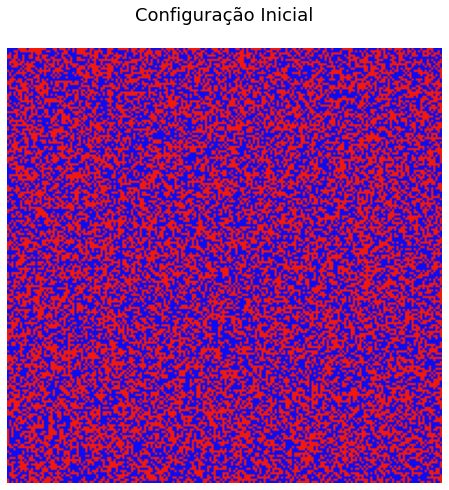

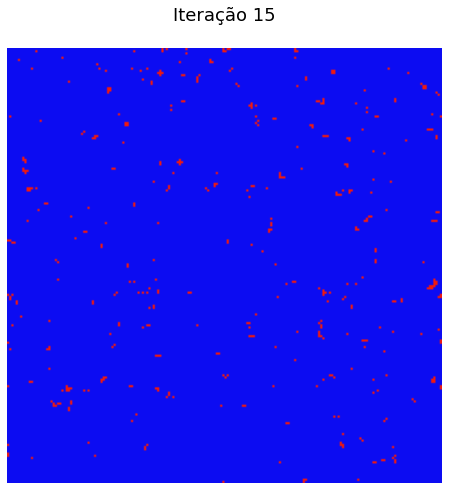

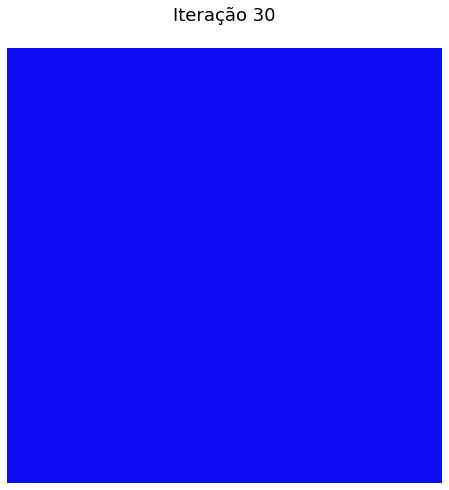

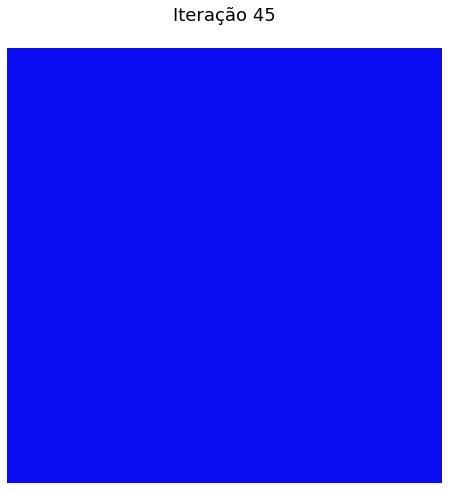

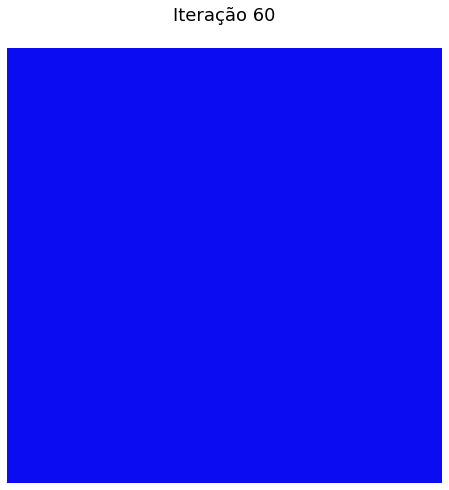

In [30]:
for i in range(0, len(configuracoes), passo):
    
    mostrar_rede(configuracoes[i], str(i))

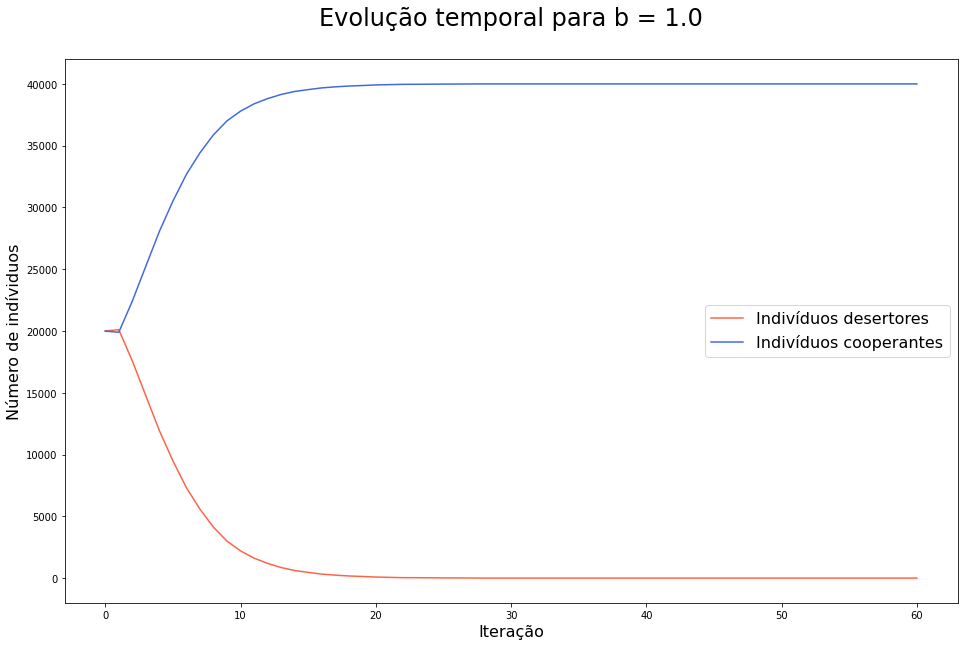

In [31]:
exibir_evolucao_dos_estados(evolucao, num_iteracoes, b)

#### b = 1.1

In [32]:
b = 1.1
configuracoes, evolucao = iniciar_jogo(200, b, K, num_iteracoes)

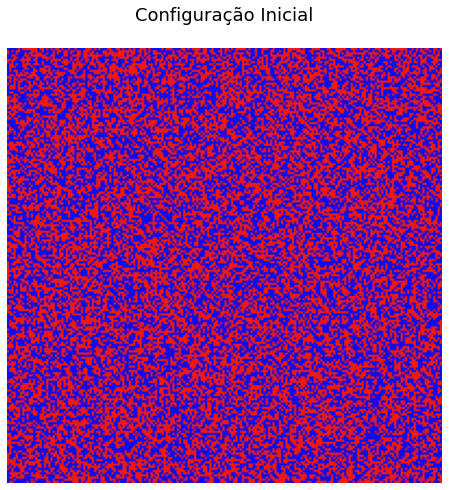

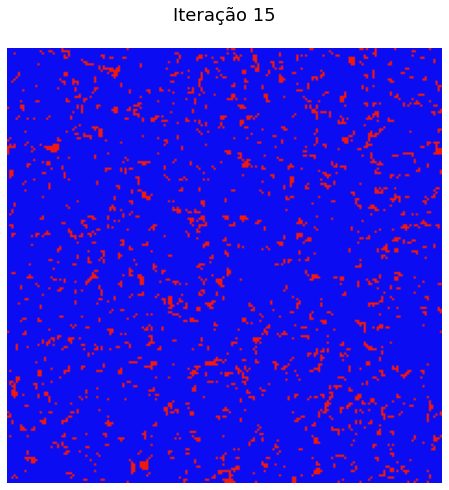

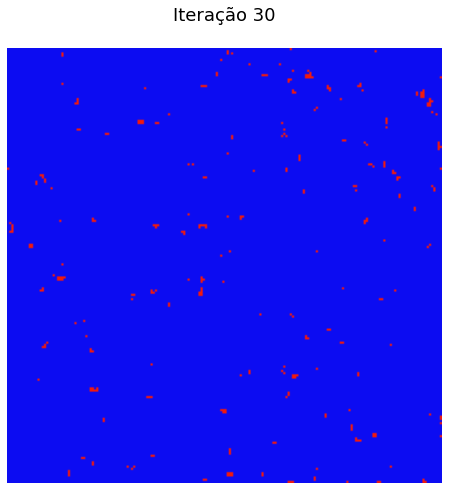

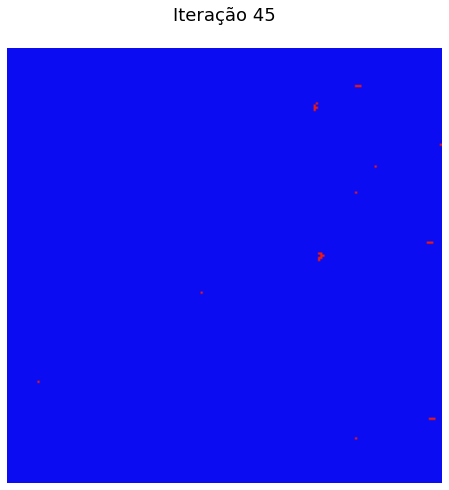

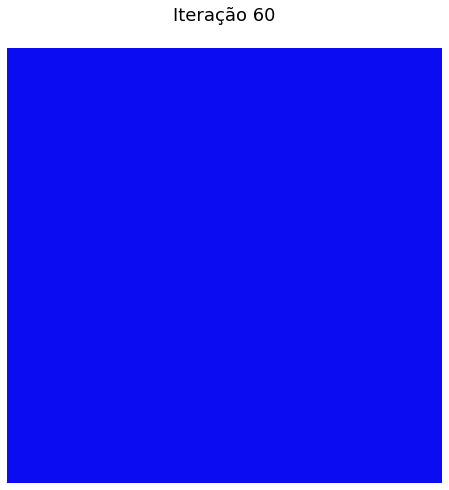

In [33]:
for i in range(0, len(configuracoes), passo):
    
    mostrar_rede(configuracoes[i], str(i))

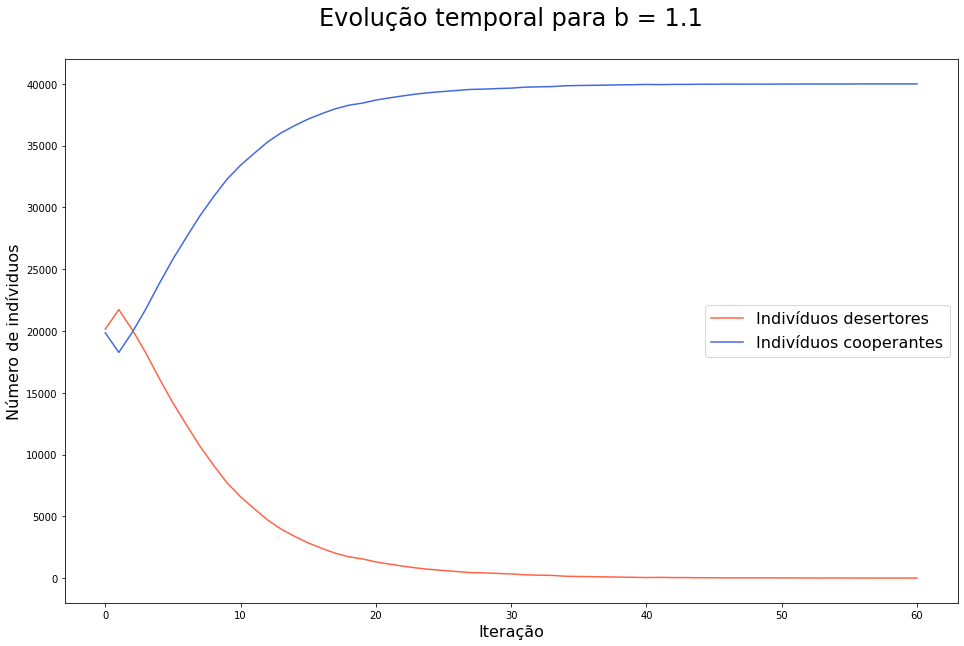

In [34]:
exibir_evolucao_dos_estados(evolucao, num_iteracoes, b)

#### b = 1.2

In [35]:
b = 1.2
configuracoes, evolucao = iniciar_jogo(200, b, K, num_iteracoes)

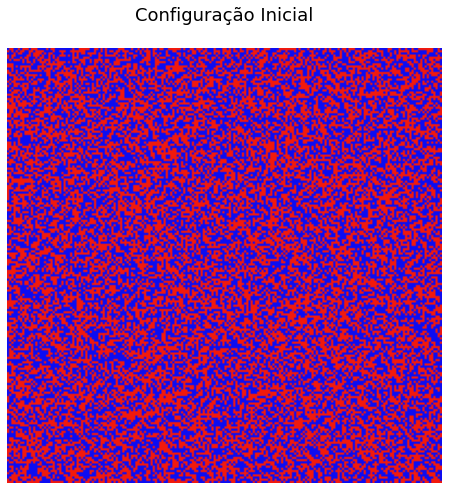

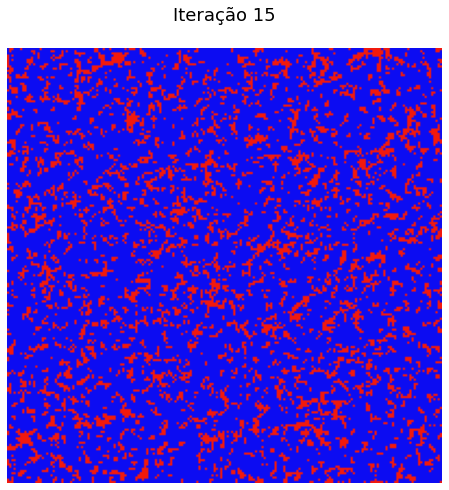

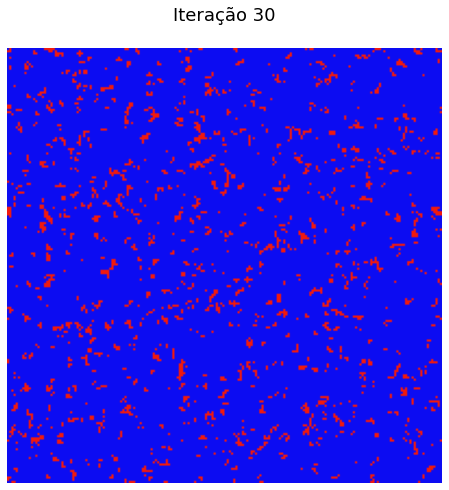

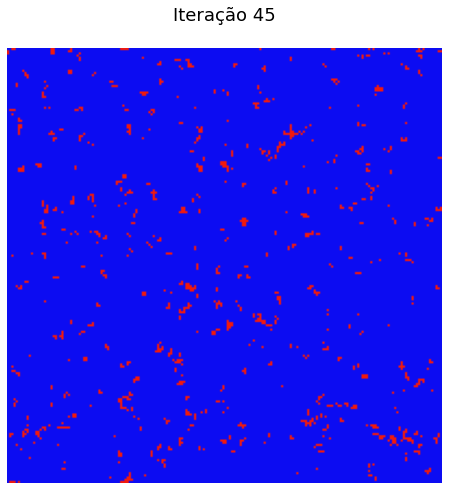

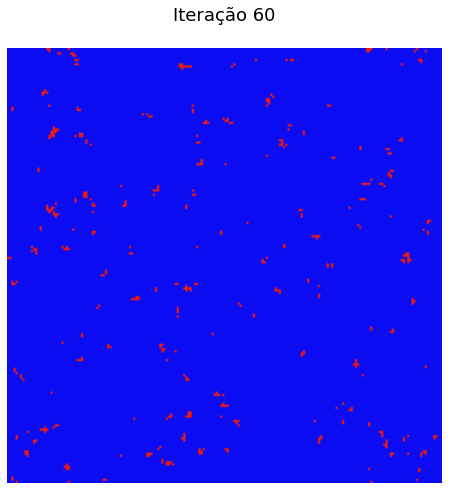

In [36]:
for i in range(0, len(configuracoes), passo):
    
    mostrar_rede(configuracoes[i], str(i))

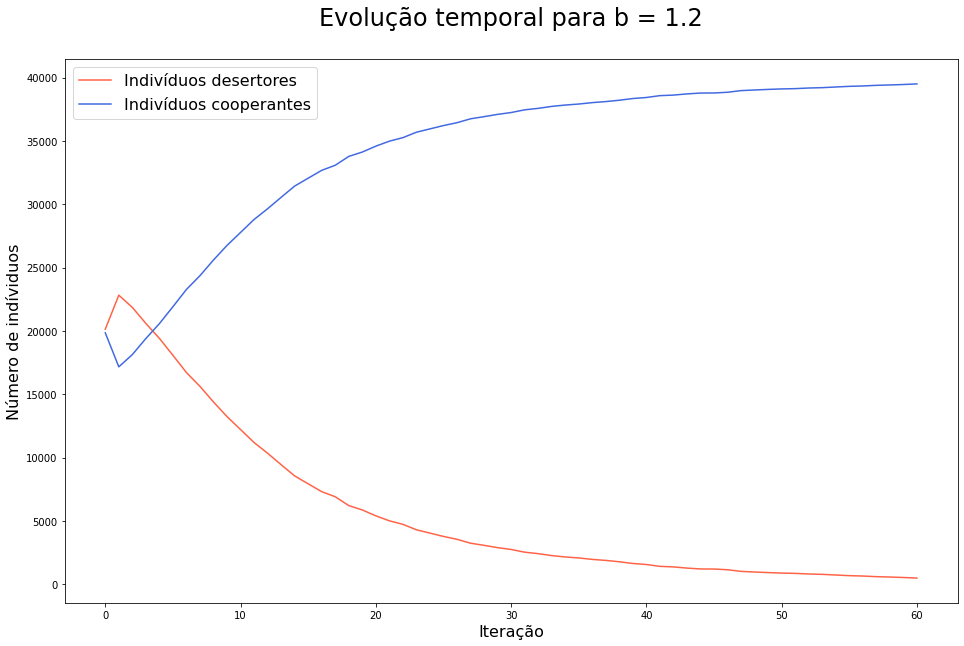

In [37]:
exibir_evolucao_dos_estados(evolucao, num_iteracoes, b)

#### b = 1.3

In [38]:
b = 1.3
configuracoes, evolucao = iniciar_jogo(200, b, K, num_iteracoes)

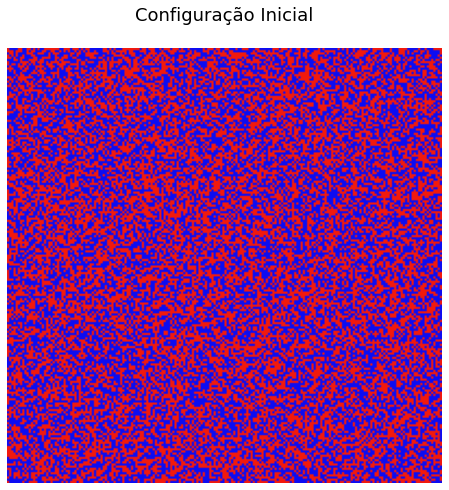

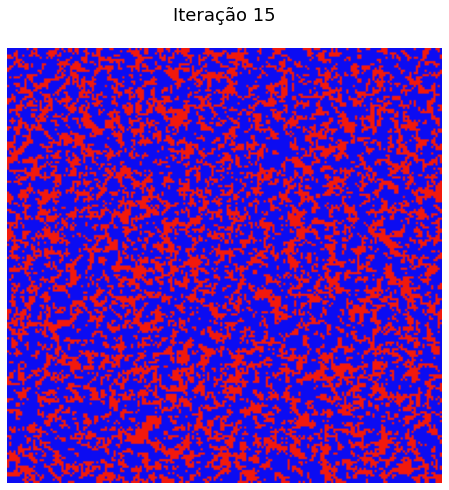

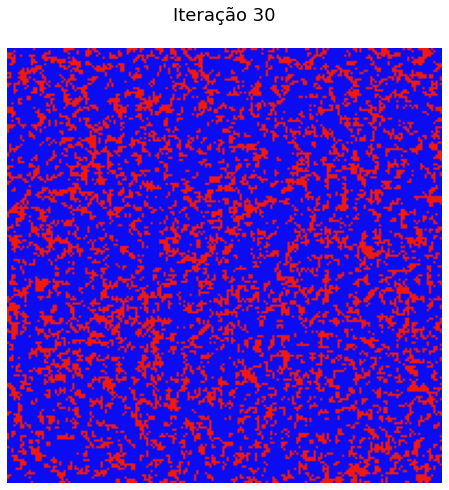

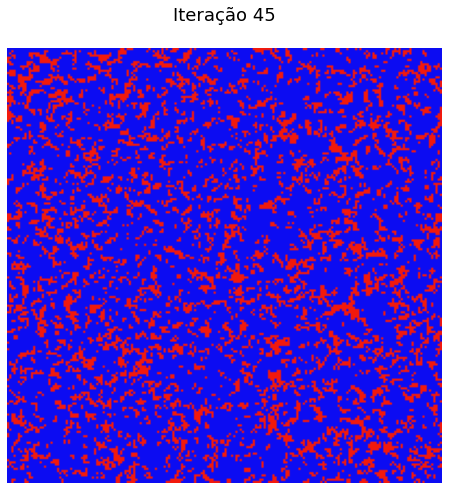

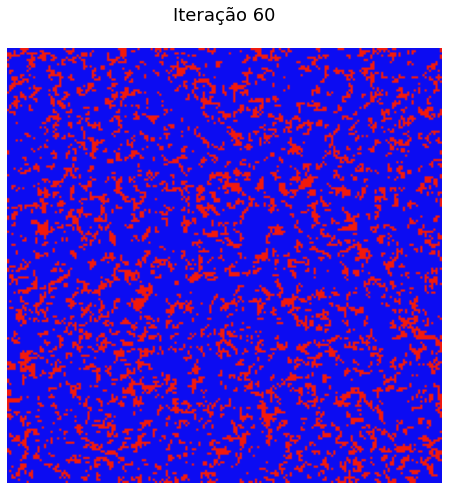

In [39]:
for i in range(0, len(configuracoes), passo):
    
    mostrar_rede(configuracoes[i], str(i))

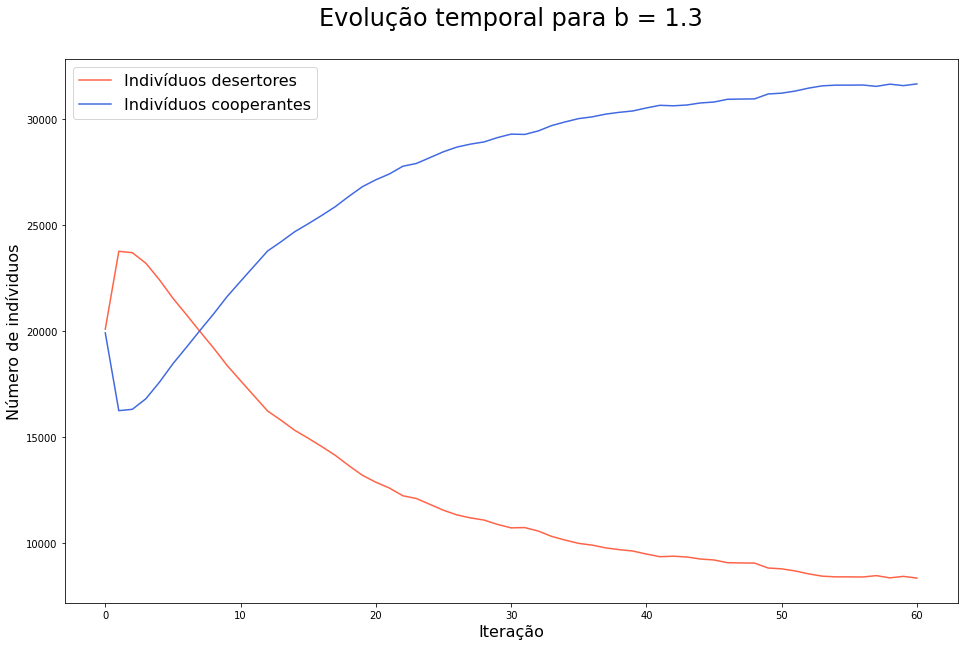

In [40]:
exibir_evolucao_dos_estados(evolucao, num_iteracoes, b)

#### b = 1.4

In [41]:
b = 1.4
configuracoes, evolucao = iniciar_jogo(200, b, K, num_iteracoes)

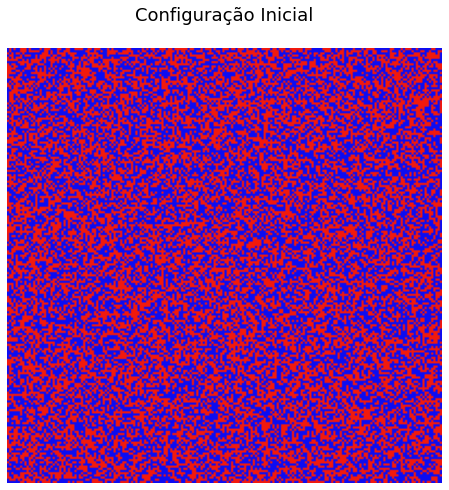

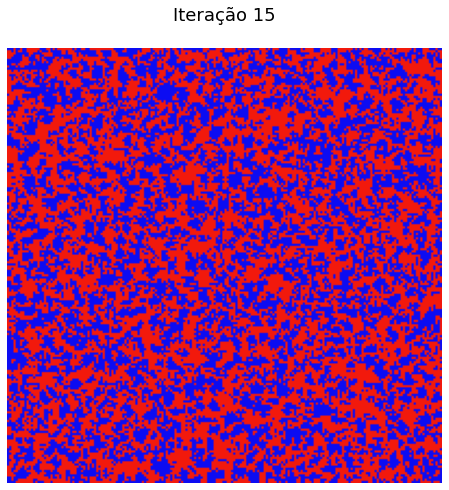

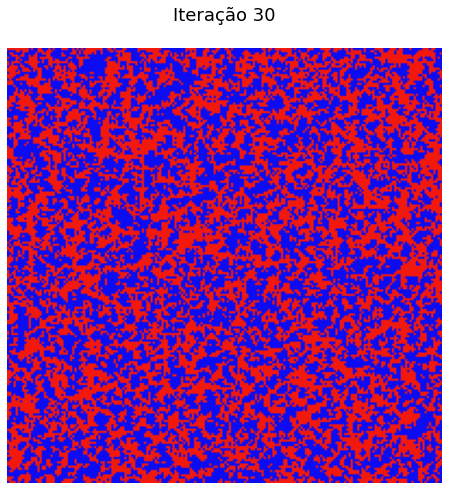

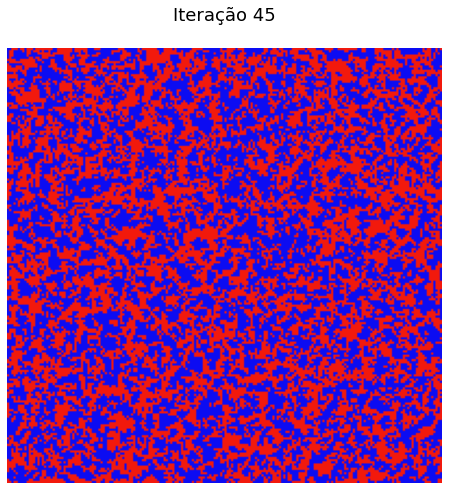

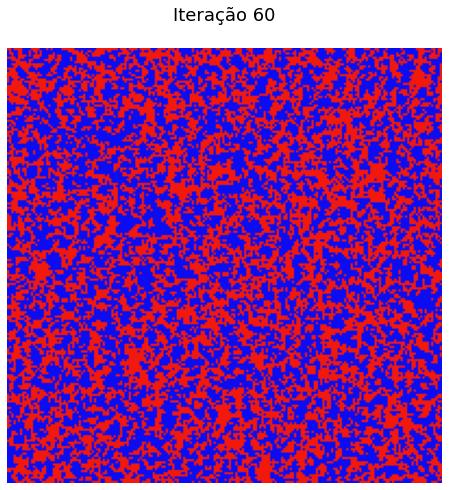

In [42]:
for i in range(0, len(configuracoes), passo):
    
    mostrar_rede(configuracoes[i], str(i))

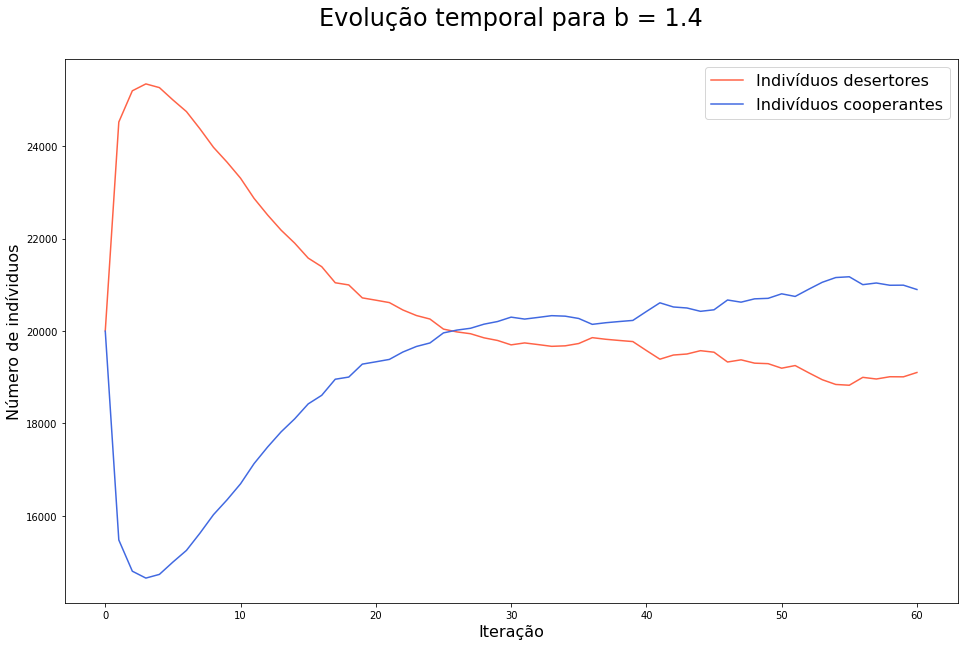

In [43]:
exibir_evolucao_dos_estados(evolucao, num_iteracoes, b)

#### b = 1.5

In [44]:
b = 1.5
configuracoes, evolucao = iniciar_jogo(200, b, K, num_iteracoes)

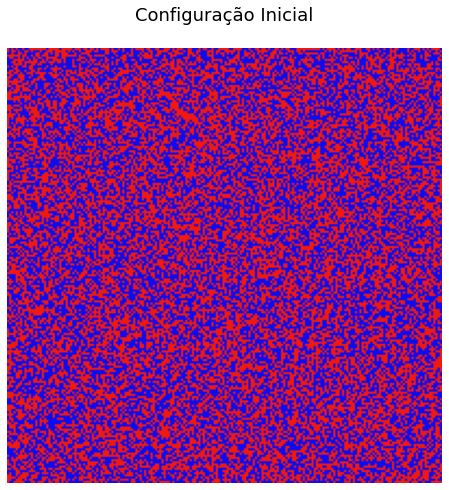

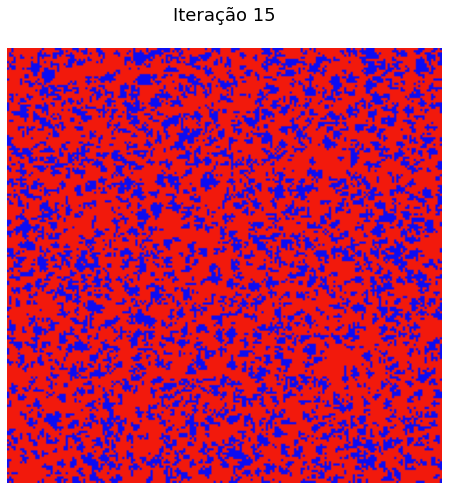

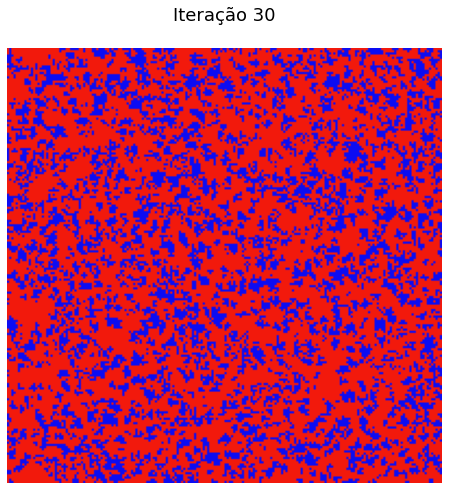

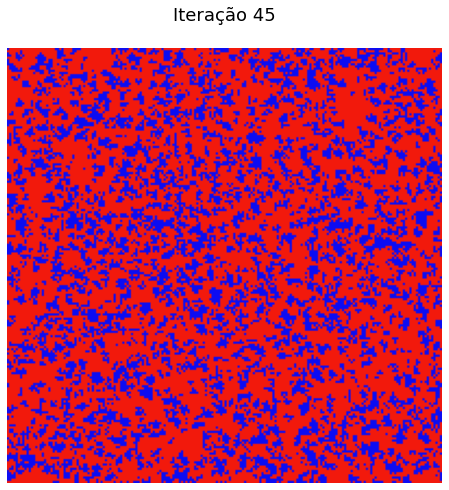

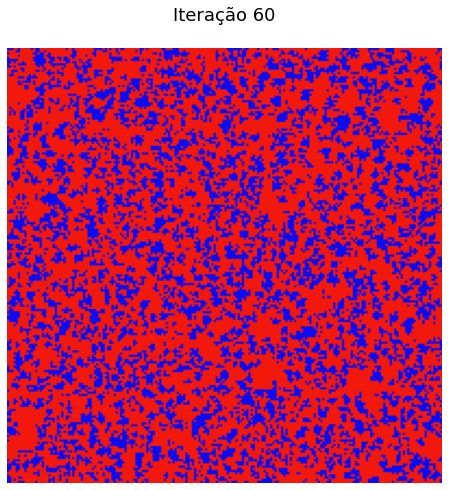

In [45]:
for i in range(0, len(configuracoes), passo):
    
    mostrar_rede(configuracoes[i], str(i))

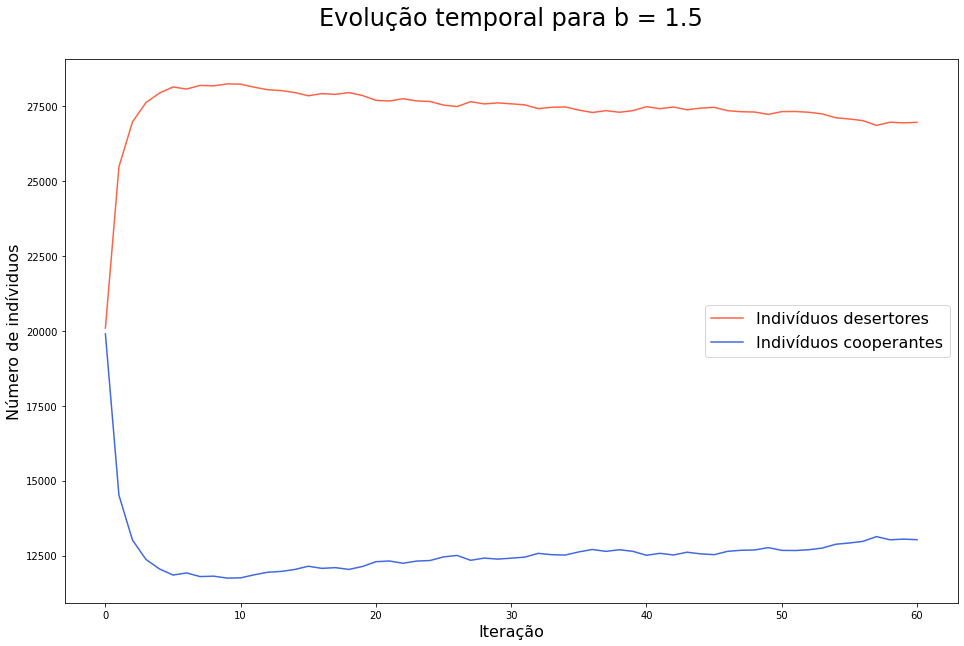

In [46]:
exibir_evolucao_dos_estados(evolucao, num_iteracoes, b)

#### b = 1.6

In [47]:
b = 1.6
configuracoes, evolucao = iniciar_jogo(200, b, K, num_iteracoes)

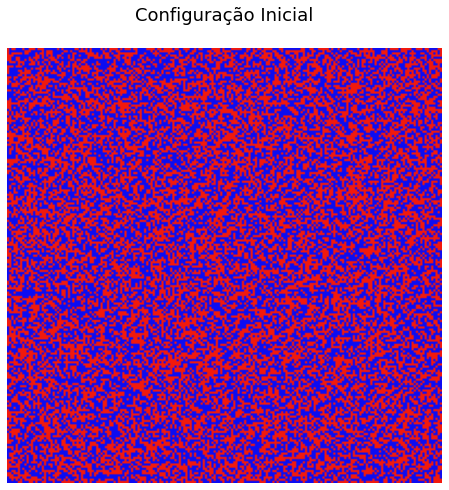

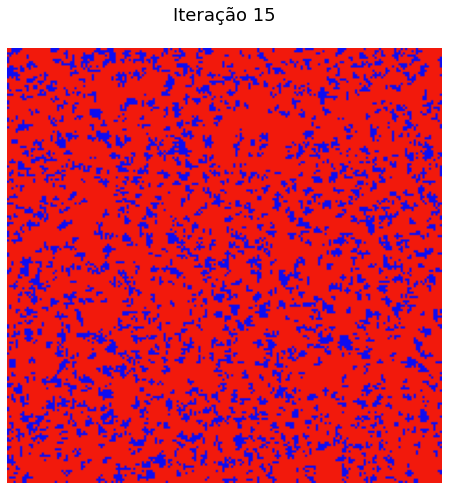

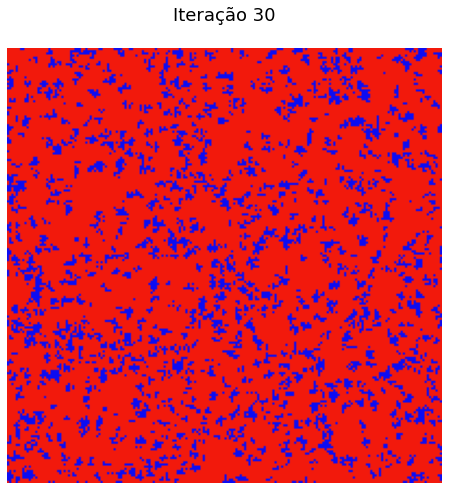

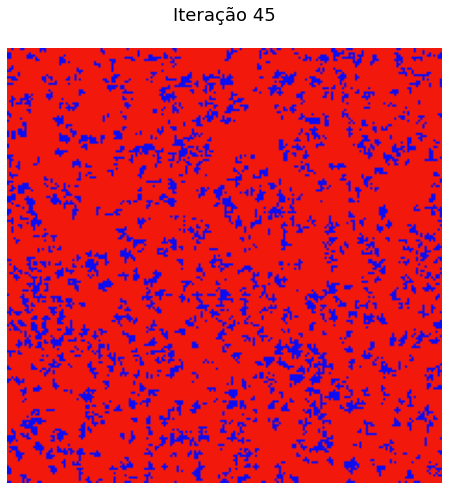

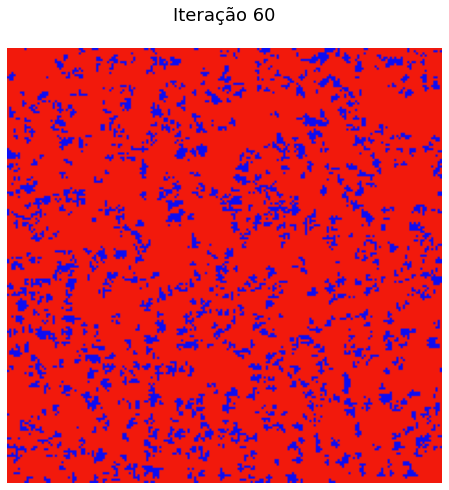

In [48]:
for i in range(0, len(configuracoes), passo):
    
    mostrar_rede(configuracoes[i], str(i))

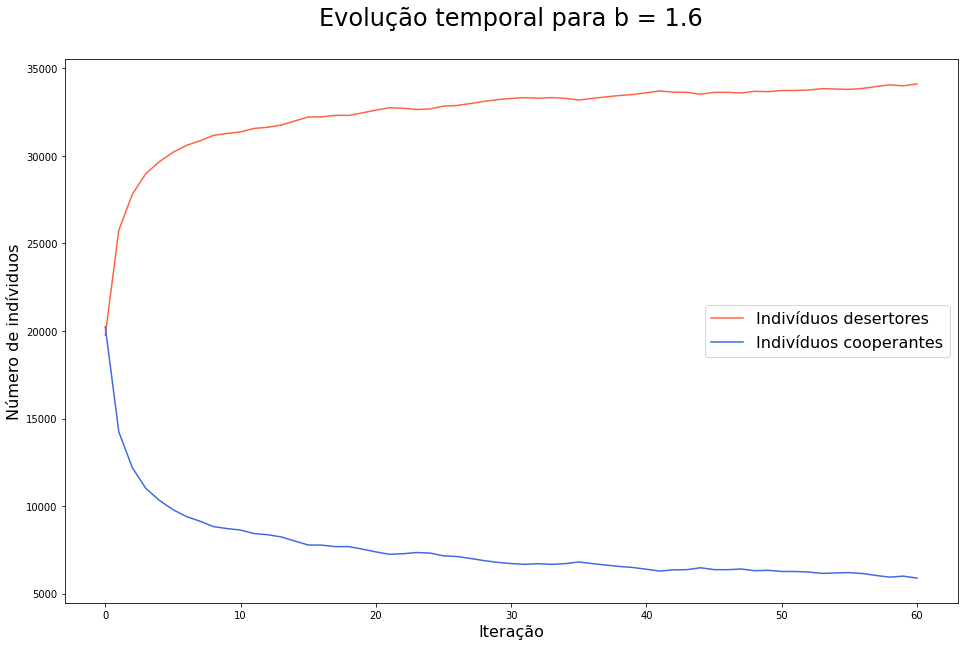

In [49]:
exibir_evolucao_dos_estados(evolucao, num_iteracoes, b)

#### b = 1.7

In [50]:
b = 1.7
configuracoes, evolucao = iniciar_jogo(200, b, K, num_iteracoes)

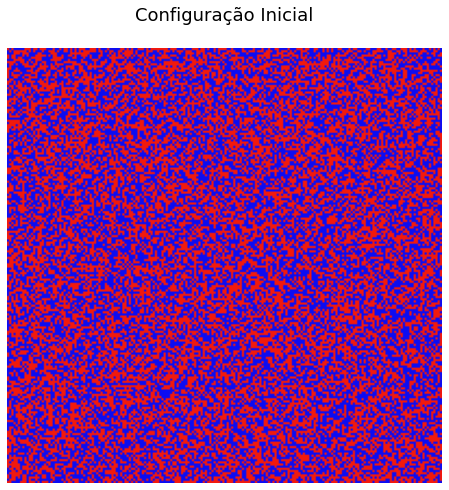

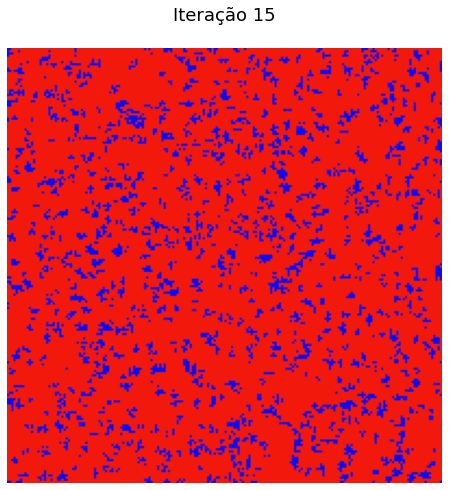

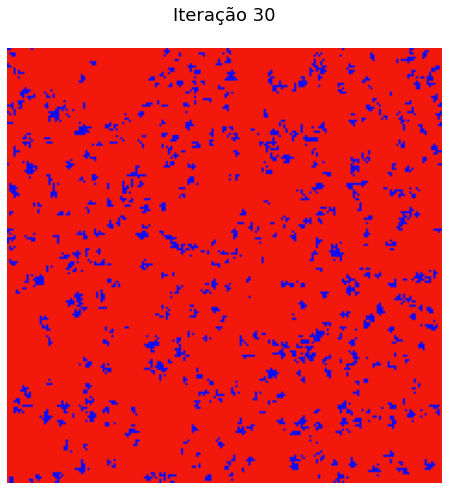

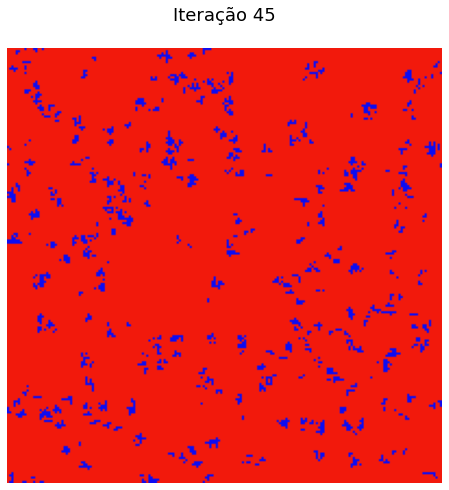

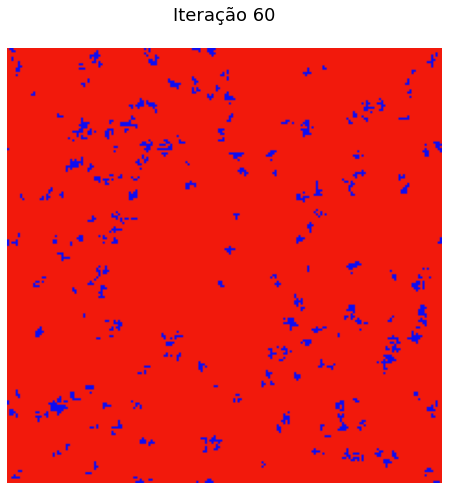

In [51]:
for i in range(0, len(configuracoes), passo):
    
    mostrar_rede(configuracoes[i], str(i))

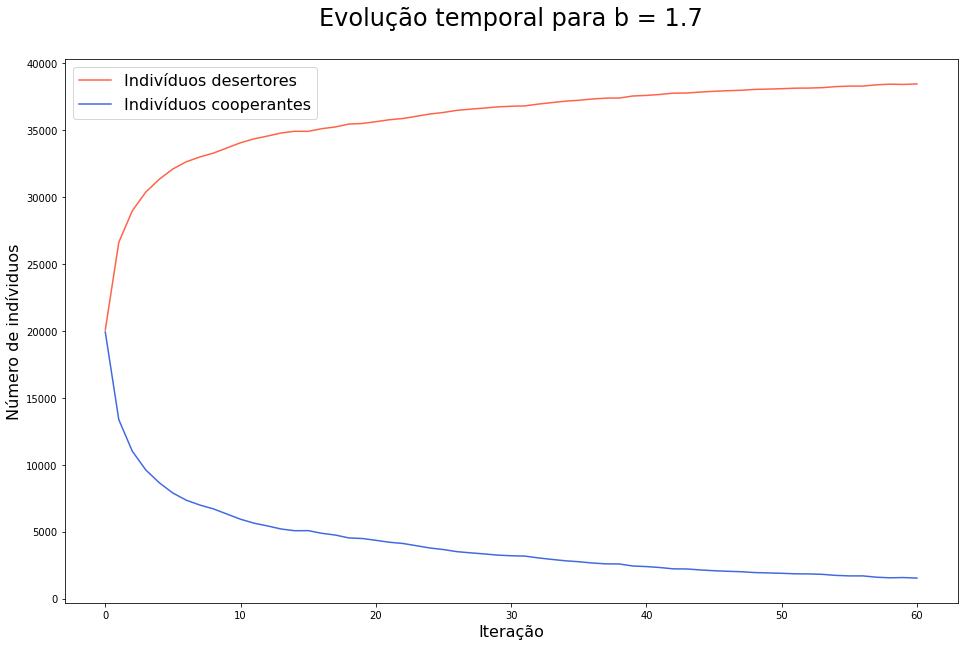

In [52]:
exibir_evolucao_dos_estados(evolucao, num_iteracoes, b)

#### b = 1.8

In [53]:
b = 1.8
configuracoes, evolucao = iniciar_jogo(200, b, K, num_iteracoes)

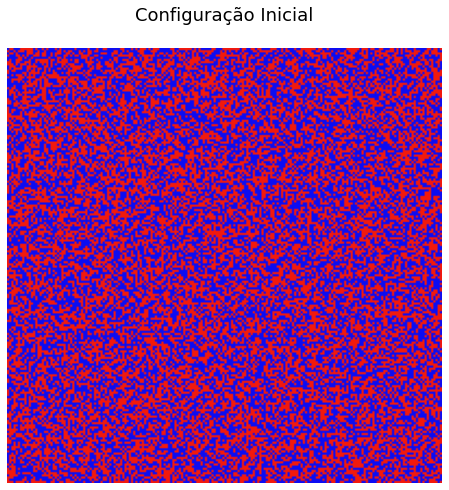

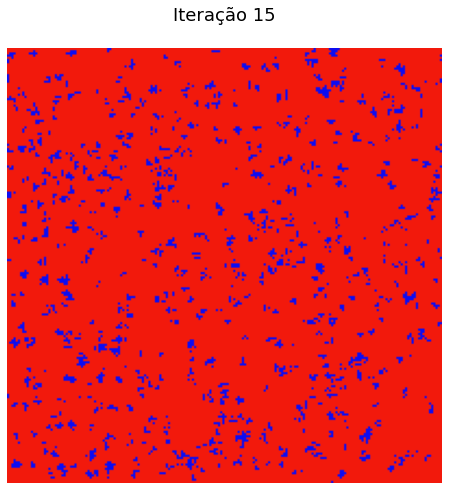

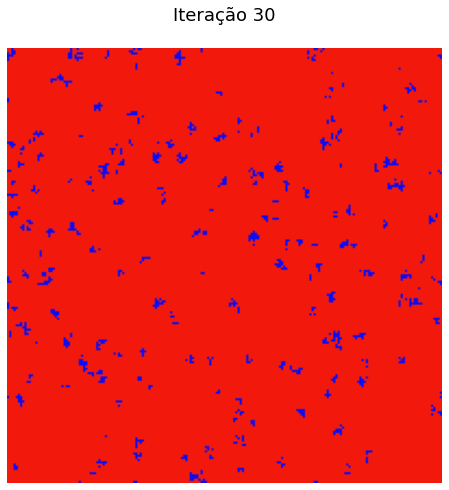

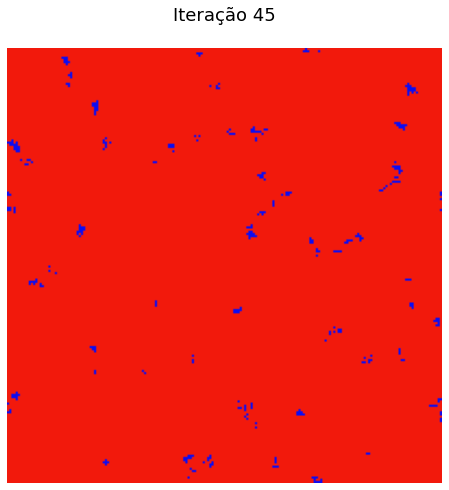

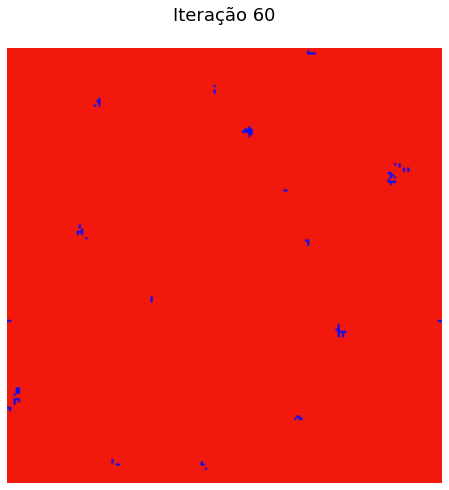

In [54]:
for i in range(0, len(configuracoes), passo):
    
    mostrar_rede(configuracoes[i], str(i))

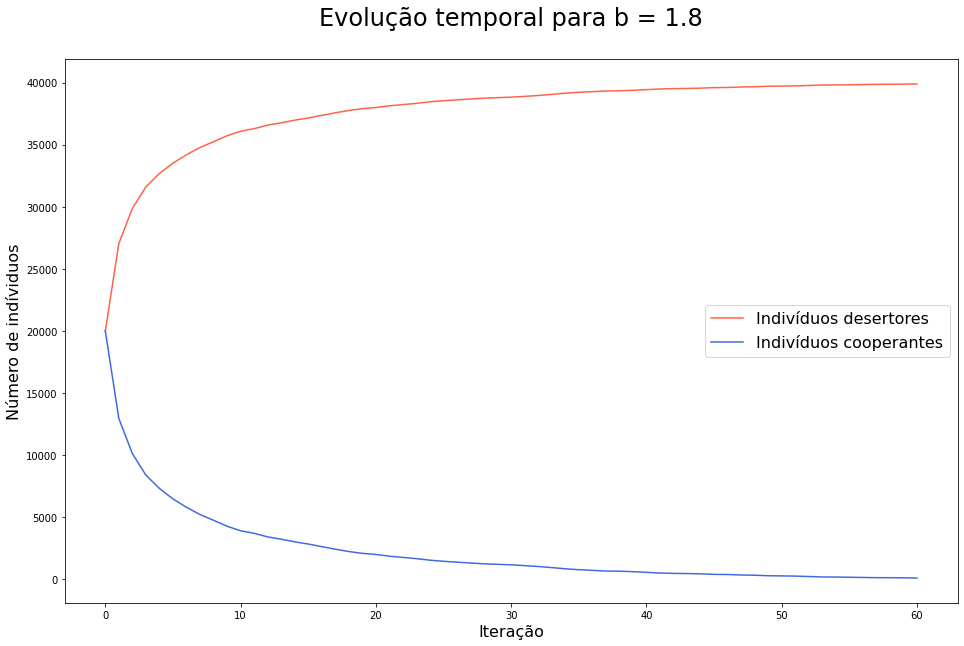

In [55]:
exibir_evolucao_dos_estados(evolucao, num_iteracoes, b)

#### b = 1.9

In [56]:
b = 1.9
configuracoes, evolucao = iniciar_jogo(200, b, K, num_iteracoes)

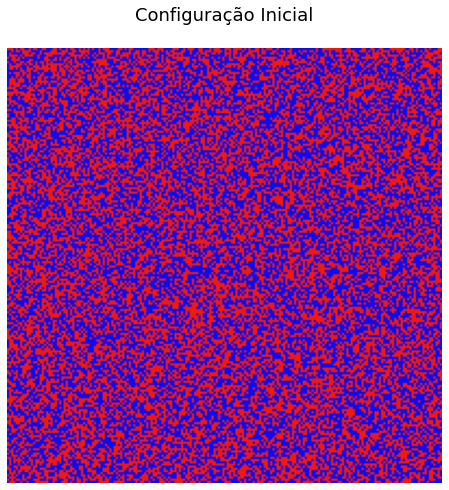

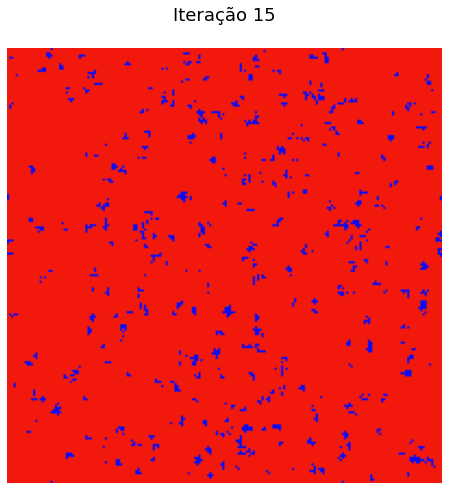

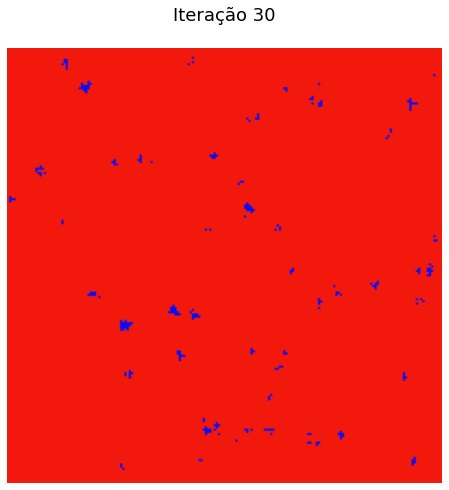

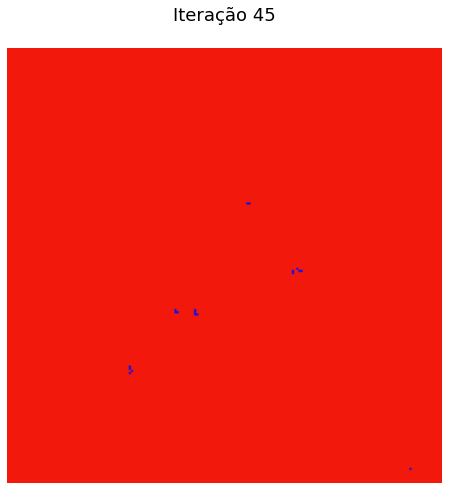

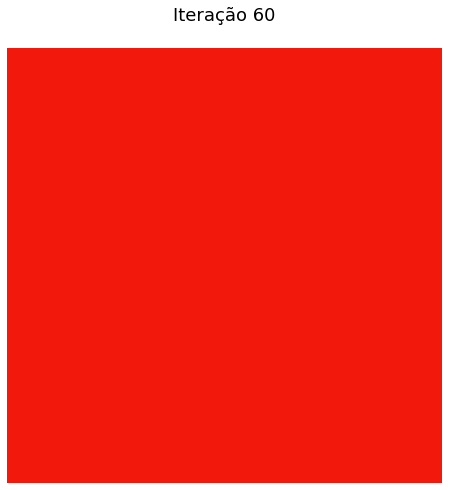

In [57]:
for i in range(0, len(configuracoes), passo):
    
    mostrar_rede(configuracoes[i], str(i))

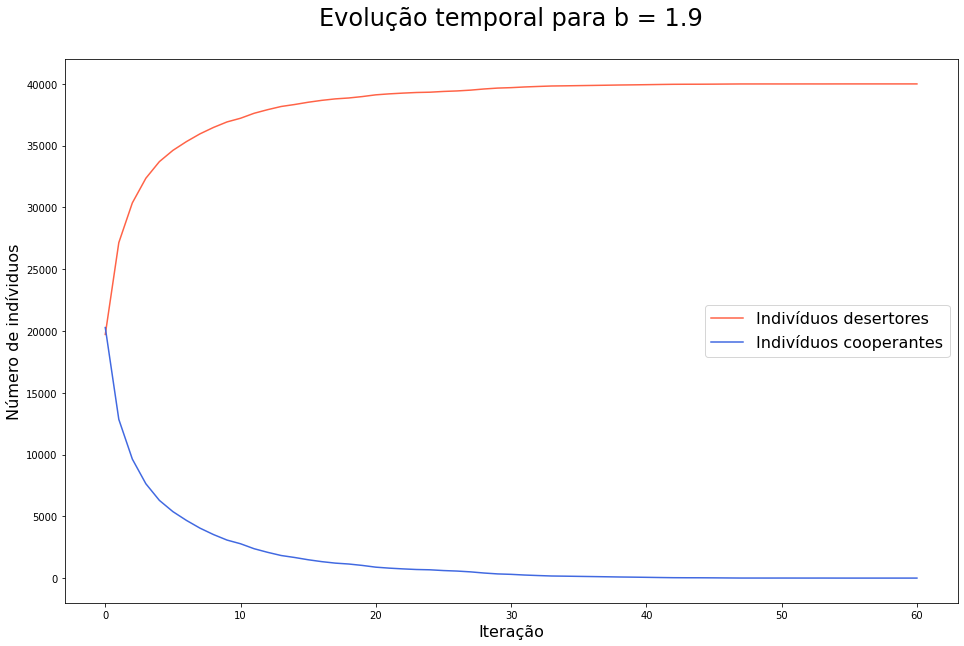

In [58]:
exibir_evolucao_dos_estados(evolucao, num_iteracoes, b)

#### b = 2.0

In [59]:
b = 2.0
configuracoes, evolucao = iniciar_jogo(200, b, K, num_iteracoes)

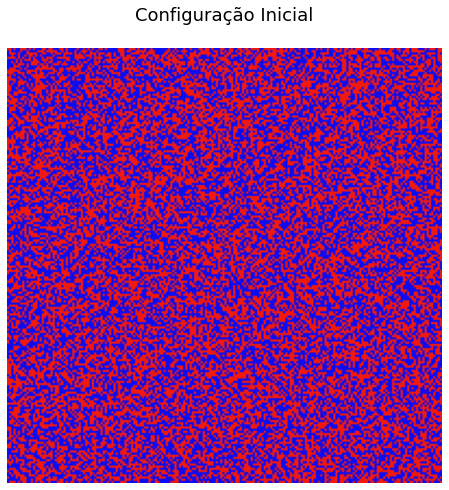

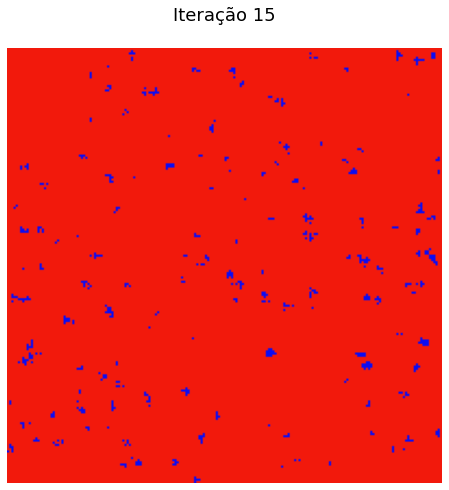

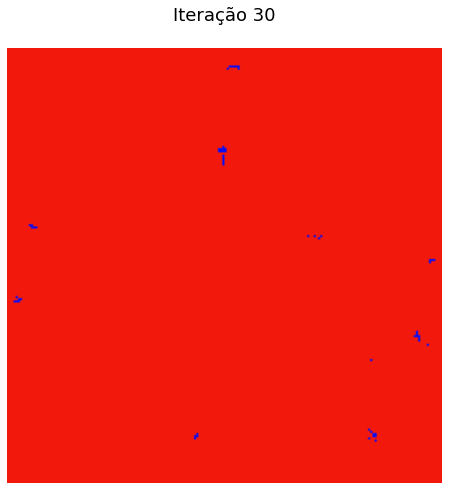

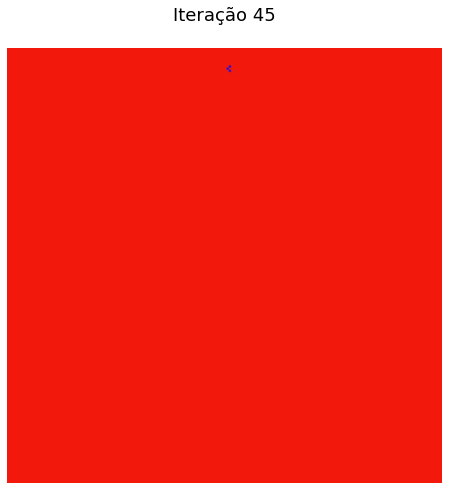

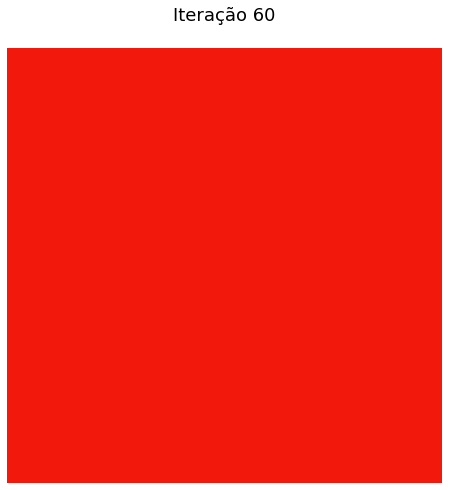

In [60]:
for i in range(0, len(configuracoes), passo):
    
    mostrar_rede(configuracoes[i], str(i))

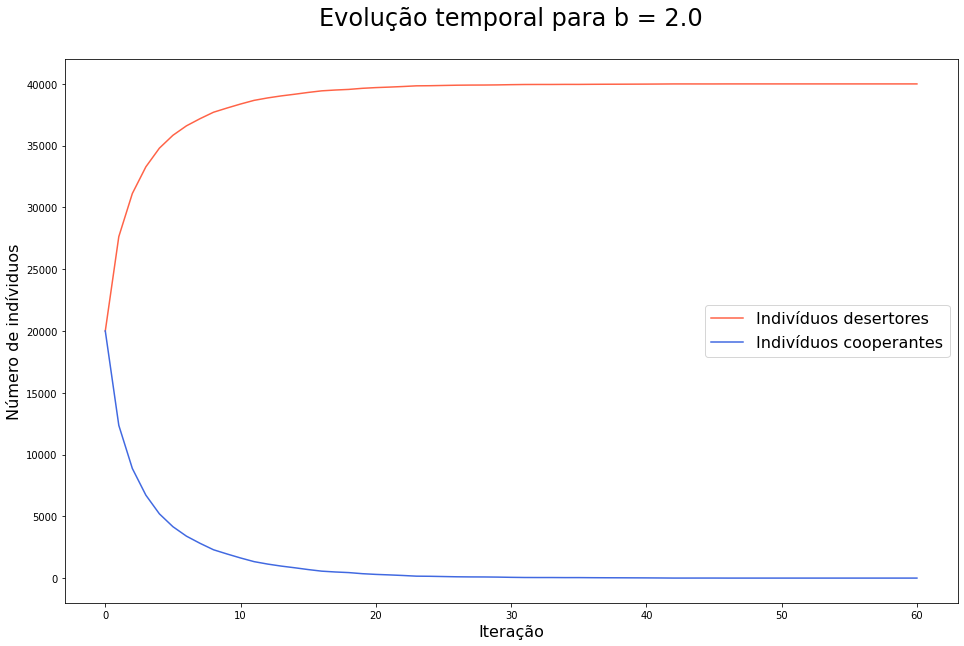

In [61]:
exibir_evolucao_dos_estados(evolucao, num_iteracoes, b)

## Análise dos resultados

Gerou-se os resultados utilizando-se uma rede de tamanho L = 200, um valor de K igual a 0.3 e variando-se os valores de b entre 1.0 e 2.0 com incremento de 0.1 a cada nova configuração. Realizou-se 60 iterações para cada uma das configurações, sendo que o estado da rede foi mostrado a cada 15 iterações.

Para valores de b entre 1.0 e 1.4, percebe-se nos gráficos de evolução temporal que há uma certa tendência inicial de haver maior número de indivíduos desertores, mas que, ao longo das iterações, essa maioria é superada pelo número de indivíduos cooperantes. É possível observar que, quanto maior o valor de b, maior será a iteração em que o número de indivíduos cooperantes ultrapassa o número de indivíduos desertores. Por exemplo, para b = 1.0, essa ultrapassagem já ocorre antes da iteração 3. Já para b = 1.2 isso parece ocorrer na iteração 5, enquanto acontece depois da iteração 23 para b = 1.4.

Especialmente para b = 1.4, é possível reparar que o sistema não se estabiliza ao longo das 60 iterações, sendo isso um indício de que indivíduos tem dúvidas em relação a qual é a melhor estratégia a ser adotada.

Já para os valores de b superiores a 1.5, nota-se que o número de indivíduos desertores cresce rapidamente, sendo que o sistema parece ter a tendência de permanecer com maior número de indivíduos desertores para b maior que 1.6. Para b igual a 1.5, há uma certa propensão a queda após a iteração 10.

Portanto, para K igual a 0.3, estima-se que b1, limite a partir do qual cooperadores começam a prevalecer, esteja entre 1.2 e 1.3. Enquanto isso, b2 parece estar valor localizando no intervalo de 1.5 a 1.6, já que o gráfico associado a b igual 1.6 foi o primeiro a apresentar uma prevalência clara de indivíduos desertores.

In [ ]:
def Metropolis(L, b, K, iteracoes = 30):

    conf = gerarRede(L)
    vizinhos = gerar_vizinhos(L)
    ganhos = analisar_ganhos(configuracao_atual, vizinhos, b)
    
    evolucao = np.array([contarCasos(configuracao_atual)])

    for i in range(iteracoes):

      conf = atualizar_rede(configuracao_atual, vizinhos, ganhos_atuais, K)
        
      ganhos = calcular_ganhos(configuracao_atual, vizinhos, b)
      evolucao= np.vstack([evolucao_dos_estados, contarCasos(configuracao_atual)])
    
    return evolucao

In [ ]:
def analisarGanhos(rede, viz, array_ganhos, K):
  
  tamanho = len(rede)
  configuracao = np.copy(rede)

  for j in range(tamanho):
    
    v = np.random.randint(4)
    E_x = array_ganhos[j]
    E_y = array_ganhos[viz[j, v]]
        
    if random.random() > 1 / (1 + np.power(np.e, (-(E_y - E_x) / K))):
        continue
        
    else:
        configuracao[j] = rede[v]
        
  return configuracao

In [3]:
def analisarGanhos(valor_b, rede, v):
    
    resultados = np.zeros(tamaho)
    tamanho = len(rede)
    
    for j in range(tamanho):
        
      soma = 0
      for k in range(4):
        aux = v[j, k]
        soma = soma + rede[aux]
        
      if rede[i] == 1:
        resultados[i] = 1 + soma
        continue
      resultados[i] = valor_b * soma
    
    return resultados